In [1]:
# Install necessary packages
!pip install mediapipe opencv-python matplotlib

In [18]:
!pip install mediapipe>=0.10.8

In [19]:
!pip install --upgrade numpy
!pip install --upgrade scipy

  Using cached numpy-2.2.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
Using cached numpy-2.2.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.4 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mediapipe 0.10.21 requires numpy<2, but you have numpy 2.2.5 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.5 which is incompatible.
ydf 0.11.0 requires protobuf<6.0.0,>=5.29.1, but you have protobuf 4.25.6 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.5 which is incompatible.


In [1]:
# Import libraries
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
from google.colab import files
from PIL import Image
import numpy as np


In [2]:
%cd /content/drive/MyDrive/train/StepForward/

/content/drive/MyDrive/train/StepForward


In [13]:
!ls

pose_landmark_lite.tflite  ScreenRecorderProject1.mp4  StepForward


In [ ]:
!unzip /content/drive/MyDrive/train/StepForward/stepForwards.zip

Archive:  /content/drive/MyDrive/train/StepForward/stepForwards.zip
  inflating: frame0Base.jpg          
  inflating: frame1Base.jpg          
  inflating: frame2Base.jpg          
  inflating: frame3Base.jpg          
  inflating: frame4Base.jpg          
  inflating: frame5Base.jpg          
  inflating: frame6Base.jpg          
  inflating: frame7Base.jpg          
  inflating: frame8Base.jpg          
  inflating: frame9Base.jpg          
  inflating: frame10Base.jpg         
  inflating: frame11Base.jpg         
  inflating: frame12Base.jpg         
  inflating: frame13Base.jpg         
  inflating: frame14Base.jpg         
  inflating: frame15Base.jpg         
  inflating: frame16Base.jpg         
  inflating: frame17Base.jpg         
  inflating: frame18Base.jpg         
  inflating: frame19Base.jpg         
  inflating: frame20Base.jpg         
  inflating: frame21Base.jpg         
  inflating: frame22Base.jpg         
  inflating: frame23Base.jpg         
  inflating: frame24

#MediaPipe Single test

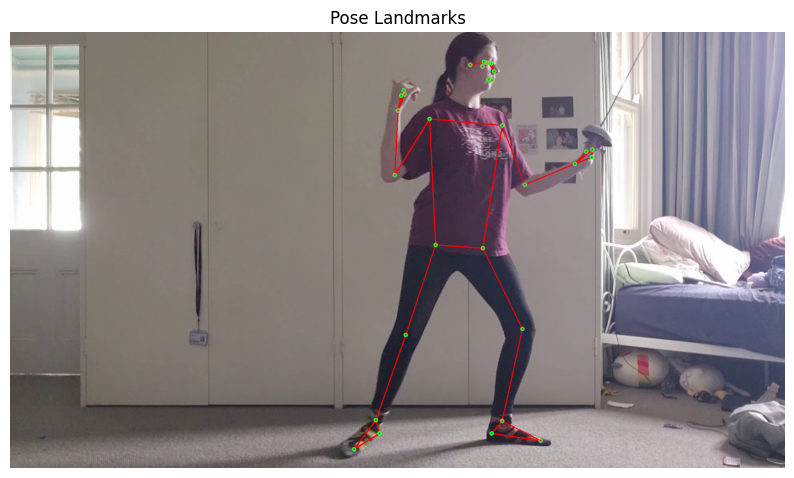

In [ ]:
## From upload



# Upload an image
# uploaded = files.upload()

# # Load image
# for filename in uploaded.keys():
#     image_path = filename

image_path = '/content/drive/MyDrive/train/StepForward/frame146Base.jpg'

# Read image using OpenCV
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


# Initialize MediaPipe Pose
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True)
mp_drawing = mp.solutions.drawing_utils

# Process the image and extract keypoints
results = pose.process(image_rgb)

# Draw keypoints and connections
if results.pose_landmarks:
    annotated_image = image_rgb.copy()
    mp_drawing.draw_landmarks(
        annotated_image,
        results.pose_landmarks,
        mp_pose.POSE_CONNECTIONS,
        mp_drawing.DrawingSpec(color=(0,255,0), thickness=2, circle_radius=3),
        mp_drawing.DrawingSpec(color=(255,0,0), thickness=2)
    )

    # Plot the image with keypoints
    plt.figure(figsize=(10, 10))
    plt.imshow(annotated_image)
    plt.title('Pose Landmarks')
    plt.axis('off')
    plt.show()
else:
    print("No pose landmarks detected.")


#Code with normal media pipe

In [5]:
import cv2
import matplotlib.pyplot as plt
import mediapipe as mp

def detect_joints(image_path, image_num=0):
  # --- load & prep your image ---
  image_bgr = cv2.imread(image_path)
  image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

  # --- set up Mediapipe Pose ---
  mp_pose    = mp.solutions.pose
  pose       = mp_pose.Pose(static_image_mode=True)

  # --- run detection ---
  results = pose.process(image_rgb)

  if results.pose_landmarks:
      annotated_bgr = image_bgr.copy()
      h, w, _       = annotated_bgr.shape
      lm            = results.pose_landmarks.landmark

      # pick nose + everything from the shoulders down
      keep_ids = { mp_pose.PoseLandmark.NOSE.value }
      below_neck = [
          mp_pose.PoseLandmark.LEFT_SHOULDER, mp_pose.PoseLandmark.RIGHT_SHOULDER,
          mp_pose.PoseLandmark.LEFT_ELBOW,    mp_pose.PoseLandmark.RIGHT_ELBOW,
          mp_pose.PoseLandmark.LEFT_WRIST,    mp_pose.PoseLandmark.RIGHT_WRIST,
          mp_pose.PoseLandmark.LEFT_INDEX,    mp_pose.PoseLandmark.RIGHT_INDEX,
          mp_pose.PoseLandmark.LEFT_HIP,      mp_pose.PoseLandmark.RIGHT_HIP,
          mp_pose.PoseLandmark.LEFT_KNEE,     mp_pose.PoseLandmark.RIGHT_KNEE,
          mp_pose.PoseLandmark.LEFT_ANKLE,    mp_pose.PoseLandmark.RIGHT_ANKLE,
          mp_pose.PoseLandmark.LEFT_HEEL,     mp_pose.PoseLandmark.RIGHT_HEEL,
          mp_pose.PoseLandmark.LEFT_FOOT_INDEX, mp_pose.PoseLandmark.RIGHT_FOOT_INDEX,
      ]
      keep_ids.update(p.value for p in below_neck)
      # mp_pose.PoseLandmark.LEFT_PINKY,    mp_pose.PoseLandmark.RIGHT_PINKY,
      # mp_pose.PoseLandmark.LEFT_THUMB,    mp_pose.PoseLandmark.RIGHT_THUMB,
      #

      # # draw green circles at each kept landmark
      # for idx in keep_ids:
      #     x_px = int(lm[idx].x * w)
      #     y_px = int(lm[idx].y * h)
      #     cv2.circle(annotated_bgr, (x_px, y_px), 6, (0,255,0), -1)

      # # build a single list of red‐line connections:
      # connections = []
      # # 1) all body‐connections in POSE_CONNECTIONS where both ends are in keep_ids
      # for start, end in mp_pose.POSE_CONNECTIONS:
      #     if start in keep_ids and end in keep_ids:
      #         connections.append((start, end))
      # # 2) add the nose→shoulder edges
      # nose_id = mp_pose.PoseLandmark.NOSE.value
      # left_sh = mp_pose.PoseLandmark.LEFT_SHOULDER.value
      # right_sh= mp_pose.PoseLandmark.RIGHT_SHOULDER.value
      # connections += [(nose_id, left_sh), (nose_id, right_sh)]

      # # draw all red lines
      # for start, end in connections:
      #     x1, y1 = int(lm[start].x * w), int(lm[start].y * h)
      #     x2, y2 = int(lm[end  ].x * w), int(lm[end  ].y * h)
      #     cv2.line(annotated_bgr, (x1,y1), (x2,y2), (0,0,255), 2)

      # # convert & show
      # annotated_rgb = cv2.cvtColor(annotated_bgr, cv2.COLOR_BGR2RGB)
      # plt.figure(figsize=(8,8))
      # plt.imshow(annotated_rgb)
      # plt.axis('off')
      # plt.title(f"Nose + Shoulders‑down (all red lines) {image_num}")
      # plt.show()
      print(f"Nose + Shoulders‑down (all red lines) {image_num}")

  else:
      print("No pose landmarks detected.")


#code with tasks API

In [24]:
!wget -O pose_landmarker_full.task \
  https://storage.googleapis.com/mediapipe-models/pose_landmarker/pose_landmarker_full/float16/latest/pose_landmarker_full.task


--2025-04-22 06:45:55--  https://storage.googleapis.com/mediapipe-models/pose_landmarker/pose_landmarker_full/float16/latest/pose_landmarker_full.task
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.101.207, 142.251.2.207, 142.250.141.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.101.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9398198 (9.0M) [application/octet-stream]
Saving to: ‘pose_landmarker_full.task’

pose_landmarker_ful 100%[===================>]   8.96M  57.9MB/s    in 0.2s    

2025-04-22 06:45:55 (57.9 MB/s) - ‘pose_landmarker_full.task’ saved [9398198/9398198]



In [27]:
!ls

'=0.10.8'		 pose_landmarker_full.task	  StepForward
 pose_detection.tflite	 pose_landmarks_detector.tflite   tmp_bundle
 pose_detector.tflite	 ScreenRecorderProject1.mp4


In [30]:
import cv2
import matplotlib.pyplot as plt
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

def detect_joints(image_path,
                  image_num: int = 0,
                  model_path: str = '/content/drive/MyDrive/train/pose_landmarker_full.task',
                  use_gpu: bool = False):
    # 1) Read your TFLite model bytes into memory
    with open(model_path, 'rb') as f:
        model_bytes = f.read()

    # --- 2. Load & prep your image
    image_bgr = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    mp_image = mp.Image(
        image_format=mp.ImageFormat.SRGB,
        data=image_rgb
    )

    # --- 3. Build BaseOptions using model_asset_buffer
    base_opts = python.BaseOptions(
        model_asset_buffer=model_bytes,
        delegate=(python.BaseOptions.Delegate.GPU if use_gpu
                  else python.BaseOptions.Delegate.CPU)
    )

    # --- 4. Configure the PoseLandmarker
    options = vision.PoseLandmarkerOptions(
        base_options=base_opts,
        running_mode=vision.RunningMode.IMAGE,
        num_poses=1,
        min_pose_detection_confidence=0.5,
        min_pose_presence_confidence=0.5,
        # tracking_confidence only applies to VIDEO/LIVE_STREAM
        output_segmentation_masks=False
    )

    with vision.PoseLandmarker.create_from_options(options) as landmarker:
        result = landmarker.detect(mp_image)

    # --- 5. Annotate as before
    if result.pose_landmarks:
        annotated = image_bgr.copy()
        h, w, _ = annotated.shape
        lm = result.pose_landmarks[0]

        keep = {mp.solutions.pose.PoseLandmark.NOSE.value}
        below = [
            mp.solutions.pose.PoseLandmark.LEFT_SHOULDER,
            mp.solutions.pose.PoseLandmark.RIGHT_SHOULDER,
            # … (rest of your list) …
        ]
        keep.update(p.value for p in below)

        for idx in keep:
            x, y = int(lm[idx].x * w), int(lm[idx].y * h)
            cv2.circle(annotated, (x, y), 6, (0, 255, 0), -1)

        conns = [(a, b) for a, b in mp.solutions.pose.POSE_CONNECTIONS
                 if a in keep and b in keep]
        n   = mp.solutions.pose.PoseLandmark.NOSE.value
        Ls  = mp.solutions.pose.PoseLandmark.LEFT_SHOULDER.value
        Rs  = mp.solutions.pose.PoseLandmark.RIGHT_SHOULDER.value
        conns += [(n, Ls), (n, Rs)]

        for a, b in conns:
            x1, y1 = int(lm[a].x * w), int(lm[a].y * h)
            x2, y2 = int(lm[b].x * w), int(lm[b].y * h)
            cv2.line(annotated, (x1, y1), (x2, y2), (0, 0, 255), 2)

        # display
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(8, 8))
        plt.imshow(annotated_rgb)
        plt.axis('off')
        plt.title(f"Nose + Shoulders‑down {image_num}")
        plt.show()

    else:
        print("No pose landmarks detected.")


#trying to use GPU

In [36]:
!unzip pose_landmarker_full.task
!ls

Archive:  pose_landmarker_full.task
 extracting: pose_detector.tflite    
 extracting: pose_landmarks_detector.tflite  
pose_detector.tflite	   pose_landmarks_detector.tflite  StepForward
pose_landmarker_full.task  ScreenRecorderProject1.mp4	   tmp_bundle


In [35]:
!pip install --upgrade tflite2onnx

In [37]:
import tflite2onnx
tflite2onnx.convert("pose_detector.tflite", "pose_detector.onnx")

NotImplementedError: Unsupported TFLite OP: 124 DENSIFY!

to run on GPU we need EGL/OpenGL ES libraries. that can't run on gogle colab but might work on AWS SageMaker.

**step 1. Choose a GPU instance**

When you create your SageMaker notebook, pick one of the GPU instance types (e.g. ml.g4dn.xlarge, ml.p3.2xlarge) so you actually have an NVIDIA card attached at the OS level

**Step 2. Install EGL/OpenGL ES dev libraries**

In the notebook’s terminal, run something like:
sudo apt-get update
sudo apt-get install -y libegl1-mesa-dev libgles2-mesa-dev

```
sudo apt-get update
sudo apt-get install -y libegl1-mesa-dev libgles2-mesa-dev

```
That brings in the headers and runtime needed for the EGL delegate to compile and load




**Step 3. Use off‑screen EGL (no real X server needed)**
Modern NVIDIA drivers support full OpenGL/EGL on a headless server via EGL alone—no X11 required. Under the hood MediaPipe’s GPU delegate uses EGL to get a context, so once those libs are in place, delegate=GPU should succeed instead of silently falling back to CPU.

Once you’ve done that setup, your same Tasks API code with


```
delegate=BaseOptions.Delegate.GPU
```



#using TF2‑GPU‑friendly Pose Model (MoveNet) (not good though)

In [38]:
!pip install tensorflow tensorflow-hub

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.5/19.5 MB 101.3 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.5
    Uninstalling numpy-2.2.5:
      Successfully uninstalled numpy-2.2.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mediapipe 0.10.21 requires numpy<2, but you have numpy 2.0.2 which is incompatible.
ydf 0.11.0 requires protobuf<6.0.0,>=5.29.1, but you have protobuf 4.25.6 which is incompatible.


In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub

# 1) Load MoveNet Lightning (fast) or Thunder (more accurate)
model = hub.load("https://tfhub.dev/google/movenet/singlepose/lightning/4")
movenet = model.signatures['serving_default']

##without rescaling the image

In [56]:
# 2) Helper to run inference
def detect_joints(image_path, imgNum=0, display=True):
    image_bgr = cv2.imread(image_path)
    image_bgr = cv2.resize(image_bgr, (192, 192))
    H, W, _ = image_bgr.shape

    # Resize + pad to 192×192, cast to int32
    img = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    img = tf.image.resize_with_pad(img, 192, 192)
    inp = tf.cast(tf.expand_dims(img, axis=0), dtype=tf.int32)

    # Run on GPU
    outputs = movenet(inp)
    kpts = outputs['output_0'].numpy()[0,0,:,:]
    # shape = [17 keypoints, (y, x, score)]

    # Map keypoints back to original image coords
    for idx, (y_rel, x_rel, score) in enumerate(kpts):
        x_px = int(x_rel * W)
        y_px = int(y_rel * H)
        color = (0,255,0) if idx in [0,5,6,7,8,9,10,11,12,13,14,15,16] else (255,0,0)
        cv2.circle(image_bgr, (x_px, y_px), 2, color, -1)

    if display:
        plt.figure(figsize=(6,6))
        plt.imshow(cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB))
        plt.axis('off')
    # return kpts

##rescaling the image

In [54]:
# 2) Helper to run inference
def detect_joints(image_path, imgNum=0, display=True):
    image_bgr = cv2.imread(image_path)
    H, W, _ = image_bgr.shape

    # Resize + pad to 192×192, cast to int32
    img = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    img = tf.image.resize_with_pad(img, 192, 192)
    inp = tf.cast(tf.expand_dims(img, axis=0), dtype=tf.int32)

    # Run on GPU
    outputs = movenet(inp)
    kpts = outputs['output_0'].numpy()[0,0,:,:]
    # shape = [17 keypoints, (y, x, score)]

    # Map keypoints back to original image coords
    for idx, (y_rel, x_rel, score) in enumerate(kpts):
        x_px = int(x_rel * W)
        y_px = int(y_rel * H)
        color = (0,255,0) if idx in [0,5,6,7,8,9,10,11,12,13,14,15,16] else (255,0,0)
        cv2.circle(image_bgr, (x_px, y_px), 5, color, -1)

    if display:
        plt.figure(figsize=(6,6))
        plt.imshow(cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB))
        plt.axis('off')
    # return kpts

#Dataset Pipeline timed test

<ipython-input-56-1dd2968494a2>:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6,6))


^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


The for loop took 21.237744092941284 seconds to execute.
^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


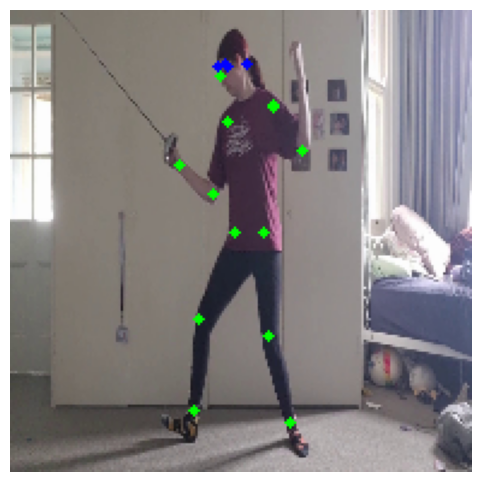

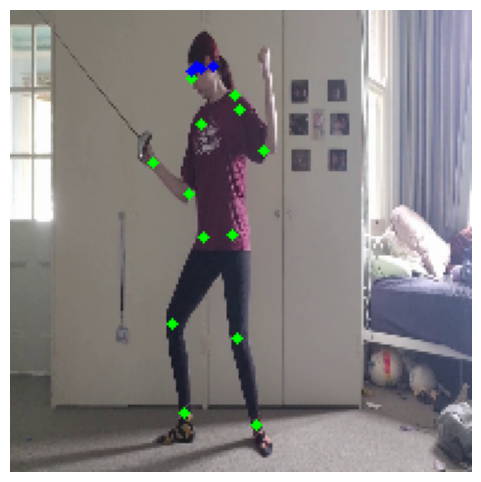

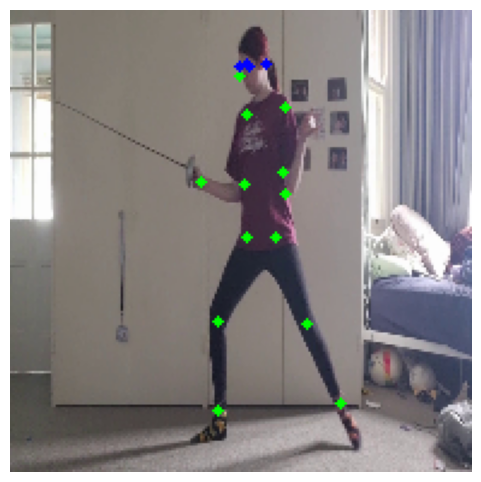

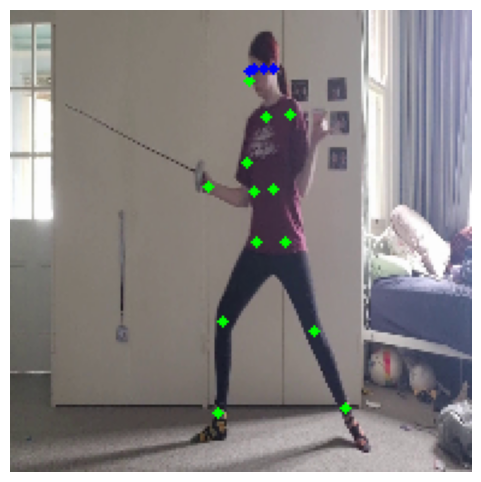

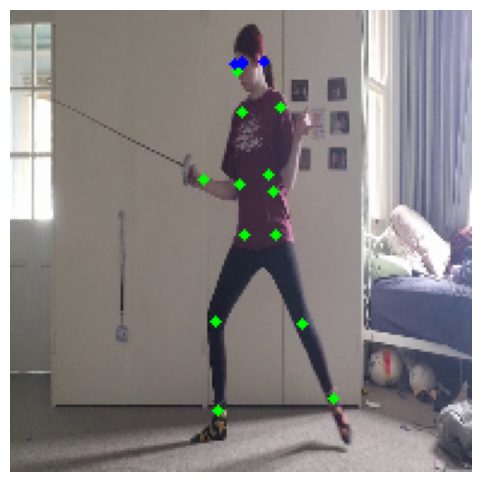

...

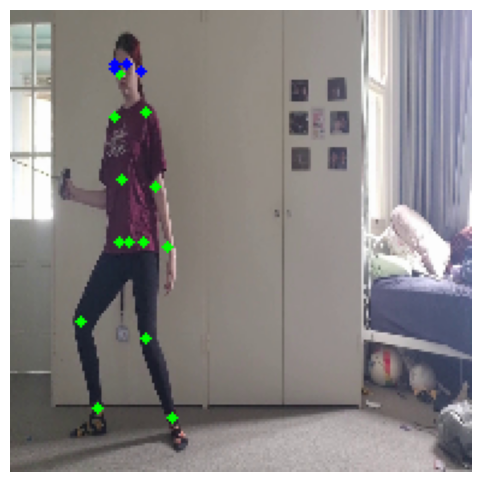

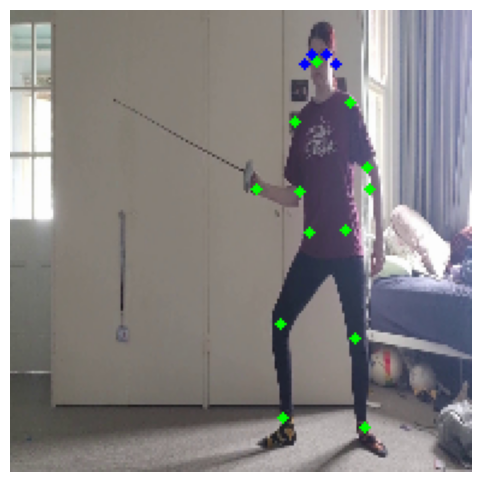

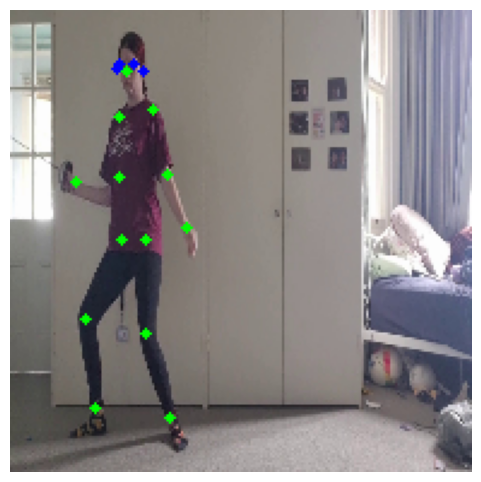

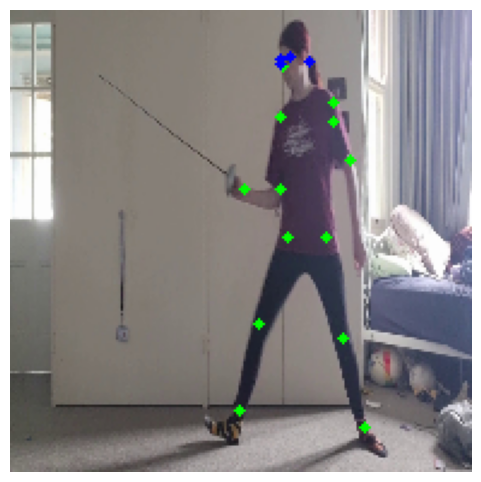

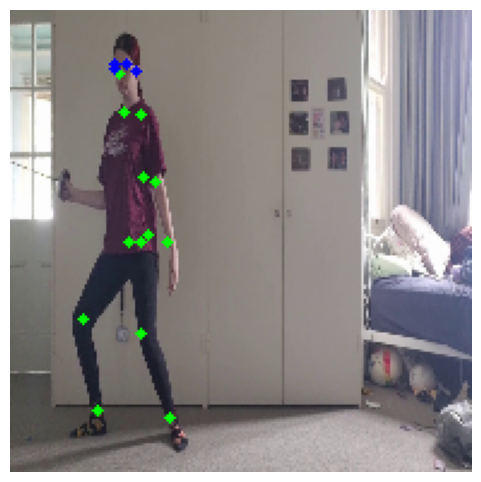

In [57]:
import time
import os

folderPath = r'/content/drive/MyDrive/train/StepForward'
allImages = os.listdir(folderPath)
allImages = allImages[2:]

start_time = time.time()  # Record the start time

for i in range(50):
  imgPath = os.path.join(folderPath, allImages[i])
  detect_joints(imgPath, i+1)

end_time = time.time()  # Record the end time

execution_time = end_time - start_time  # Calculate the total execution time
print("^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^")
print(f"\n\nThe for loop took {execution_time} seconds to execute.")
print("^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^")

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
## From augmented data



# Load image
for filename in uploaded.keys():
    image_path = filename

# Read image using OpenCV
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Initialize MediaPipe Pose
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True)
mp_drawing = mp.solutions.drawing_utils

# Process the image and extract keypoints
results = pose.process(image_rgb)

# Draw keypoints and connections
if results.pose_landmarks:
    annotated_image = image_rgb.copy()
    mp_drawing.draw_landmarks(
        annotated_image,
        results.pose_landmarks,
        mp_pose.POSE_CONNECTIONS,
        mp_drawing.DrawingSpec(color=(0,255,0), thickness=2, circle_radius=3),
        mp_drawing.DrawingSpec(color=(255,0,0), thickness=2)
    )

    # Plot the image with keypoints
    plt.figure(figsize=(10, 10))
    plt.imshow(annotated_image)
    plt.title('Pose Landmarks')
    plt.axis('off')
    plt.show()
else:
    print("No pose landmarks detected.")
